## Toxic: Preprocessing and K-Means Clustering / T-SNE

In [56]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.decomposition import NMF, LatentDirichletAllocation
from sklearn.pipeline import Pipeline

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

from wordcloud import WordCloud, STOPWORDS
from sklearn.manifold import TSNE

from time import time
import math

In [57]:
df = pd.read_pickle('../data/toxictrain.pkl')
print(df.shape)
# df.head()

(159571, 30)


### Assumptions

In [173]:
df_t = df[df['rating']>0]
df_nt = df[df['rating']==0]
print(df_t.shape)

seed = 42

categories = ['toxic', 'severe_toxic', 'obscene', 'threat','insult', 'identity_hate']

(16225, 30)


In [168]:
# Code inspired by https://github.com/ailchau/Metis_Projects/blob/master/wrangling_with_restaurant_reviews/wrangling_with_restaurant_reviews.ipynb
def reduce_dimension(data,n_clusters):
    # Dimensionality Reduction
    tfidf = TfidfVectorizer(max_df=0.6)
    X = tfidf.fit_transform(data)
#     word_list = tfidf.get_feature_names()
    nmf = NMF(n_components=n_clusters, random_state=seed, alpha=.1, l1_ratio=.5, init='nndsvd')
    X_reduced = nmf.fit_transform(X)
#     components = nmf.components_
#     for index,values in enumerate(components):
#         print("topic {}".format(index))
#         temp = list(zip(word_list, components[index]))
#         print(sorted(temp, key=lambda x: x[1], reverse=True)[:20],"\n")
    
    return X_reduced

def plot_kmc(X_reduced, n_clusters,tag):
    # plot K Means Clusters Silhouette and Clusters Analysis
    ns = np.arange(2, 20, 1)
    inertias = []
    silhouettes = []
    for n in ns:
        kmeans = KMeans(n_clusters=n, init="k-means++", random_state=seed).fit(X_reduced)
        inertias.append(kmeans.inertia_)
        labels = kmeans.labels_
        ss = silhouette_score(X_reduced, labels, metric='euclidean',sample_size=5000, random_state=seed)
        silhouettes.append(ss)
        
    fig = plt.figure(figsize=(10,4))
    ax = fig.add_subplot(1,2,1)
    # plot the inertia scores and look for the kink in the curve
    plt.plot(ns, inertias)
    plt.xlabel('Clusters')
    plt.ylabel('SSE')
    plt.title('K-Means Inertia: ' + tag, fontweight='bold',fontsize=16)

    ax = fig.add_subplot(1,2,2)
    # plot the silhouette scores
    plt.plot(ns, silhouettes)
    plt.xlabel('Clusters')
    plt.ylabel('Silhouette Coefficient')
    plt.title('K-Means Silhouette Scores: ' + tag, fontweight='bold',fontsize=16)

    plt.tight_layout()
    filepath1 = "../charts/kmc_" + tag + ".png"
    plt.savefig(filepath1)
    print("KMC saved at " + filepath1)
    # Fit Kmeans with n_clusters
    kmeans = KMeans(n_clusters=n_clusters, init="k-means++", random_state=seed)
    kmf = kmeans.fit(X_reduced)
    labels = kmf.labels_
    ssc = silhouette_score(X_reduced, labels, metric='euclidean',sample_size=5000, random_state=seed)

    print("Inertia score: {}".format(kmf.inertia_))
    print("Silhouette score: {}".format(ssc))
    for cluster in range(len(set(labels))):
        print("Cluster {} has {} comments.".format(cluster, sum(labels==cluster))) 
        
    return X_reduced, labels

def create_wordcloud(text,width,height,max_words,title):
    wordcloud = WordCloud(stopwords=STOPWORDS, width=width,height=height,max_words=max_words).generate(text)
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(title,fontweight='bold',fontsize=16)

def wordcloud_visualizations(data,X_reduced,comments,labels,n_clusters,ncols,tag):
    cluster_map = pd.DataFrame(X_reduced)
    cluster_map['comments'] = [r for r in data]
    cluster_map['cluster'] = labels
    
    fig = plt.figure(figsize=(30,20))
    ncols = ncols
    nrows = math.ceil(n_clusters / ncols)
    plt.tight_layout()

    for i in range(n_clusters):
        ax = fig.add_subplot(nrows,ncols,i+1)
        cluster = ''.join(cluster_map[cluster_map.cluster==i].comments)
        create_wordcloud(cluster,400,200,50,'Cluster {}'.format(i))
    filepath3 = "../charts/wc_kmctsne_" + tag + ".png"
    print("WordClouds saved at " + filepath3)
    plt.savefig(filepath3)
        
def plot_tsne(X_reduced, labels,tag):
    tsne = TSNE(n_components=2, perplexity=40, n_iter=500, random_state=seed)
    tsne = tsne.fit_transform(X_reduced)
    df_tsne = pd.DataFrame(tsne, columns=["tsne_x", "tsne_y"])
    df_tsne["Cluster"] = labels
    
    fig = plt.figure(figsize=(60,60))
    tsne = sns.lmplot("tsne_x", "tsne_y", data=df_tsne, fit_reg=False, hue="Cluster")
    plt.xlabel("x")
    plt.ylabel("y")
    plt.title("T-SNE: " + tag + " Clusters",fontweight='bold')
    filepath2 = "../charts/tsne_" + tag + ".png"
    plt.savefig(filepath2)
    print("T-SNE saved at " + filepath2)
    
def create_kmc_tsne(data, n_clusters, seed, ncols,tag):
    # wrapper function
    X_reduced, labels = plot_kmc(reduce_dimension(data,n_clusters),n_clusters,tag)
    wordcloud_visualizations(X_reduced,data,labels,n_clusters,ncols,tag)
    plot_tsne(X_reduced,labels,tag)

In [169]:
data = df_t.comment_text
n_clusters = 8
tag = 'Toxic'
ncols = 3

X_reduced = reduce_dimension(data, n_clusters)

KMC saved at ../charts/kmc_Toxic.png
Inertia score: 5.152774344036721
Silhouette score: 0.25030490324250065
Cluster 0 has 835 comments.
Cluster 1 has 3262 comments.
Cluster 2 has 912 comments.
Cluster 3 has 5897 comments.
Cluster 4 has 1932 comments.
Cluster 5 has 370 comments.
Cluster 6 has 1602 comments.
Cluster 7 has 1415 comments.


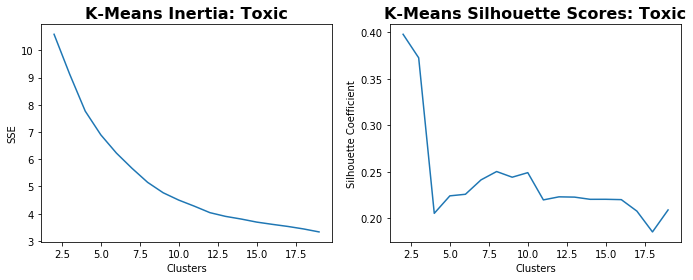

In [170]:
X_reduced, labels = plot_kmc(X_reduced,n_clusters,tag)

WordClouds saved at ../charts/wc_kmctsne_Toxic.png


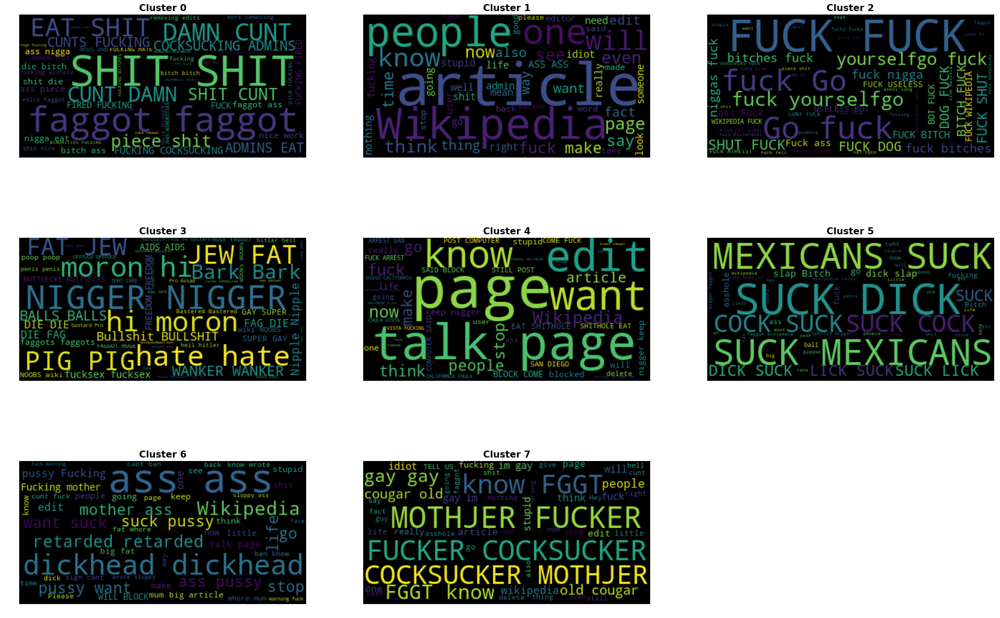

In [158]:
wordcloud_visualizations(data,X_reduced,data,labels,n_clusters,ncols,tag)

T-SNE saved at ../charts/tsne_Toxic.png


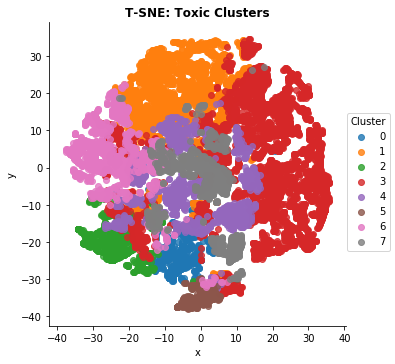

In [159]:
_ = plot_tsne(X_reduced, labels, tag)

KMC saved at ../charts/kmc_All_Words.png
Inertia score: 9.383863976765072
Silhouette score: 0.23288724296767774
Cluster 0 has 27797 comments.
Cluster 1 has 1406 comments.
Cluster 2 has 78266 comments.
Cluster 3 has 1788 comments.
Cluster 4 has 47071 comments.
Cluster 5 has 905 comments.
Cluster 6 has 1238 comments.
Cluster 7 has 1100 comments.
WordClouds saved at ../charts/wc_kmctsne_All_Words.png
T-SNE saved at ../charts/tsne_All_Words.png


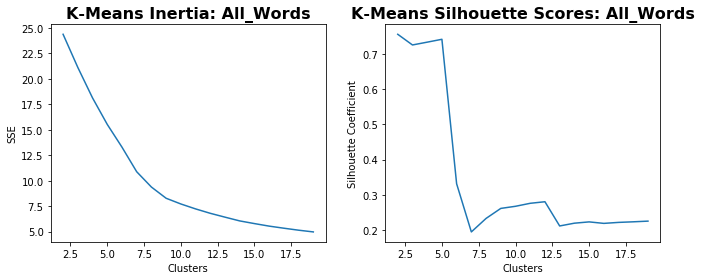

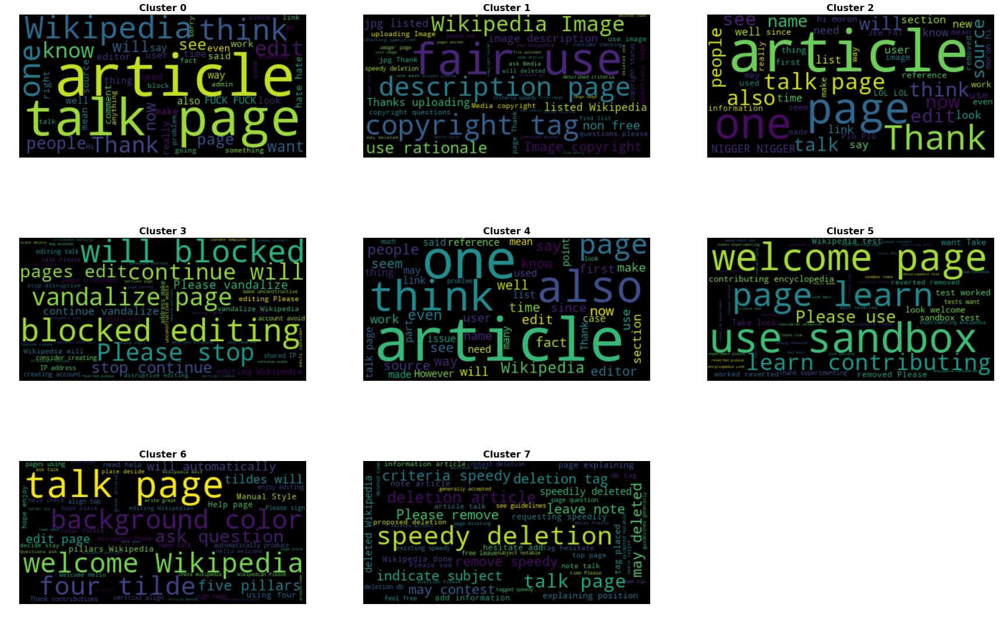

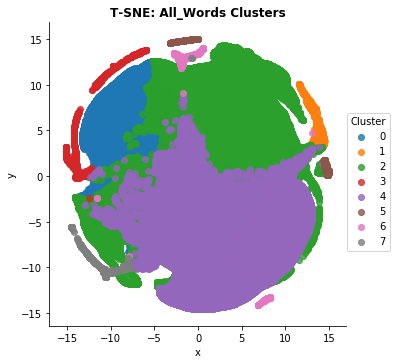

In [176]:
data = df.comment_text
n_clusters = 8
tag = 'All_Words'
ncols = 3

X_reduced = reduce_dimension(data, n_clusters)
X_reduced, labels = plot_kmc(X_reduced,n_clusters,tag)
wordcloud_visualizations(data,X_reduced,data,labels,n_clusters,ncols,tag)
_ = plot_tsne(X_reduced, labels, tag)

KMC saved at ../charts/kmc_Toxic.png
Inertia score: 7.3313657657243345
Silhouette score: 0.2117271591744663
Cluster 0 has 2908 comments.
Cluster 1 has 2945 comments.
Cluster 2 has 4557 comments.
Cluster 3 has 1796 comments.
Cluster 4 has 855 comments.
Cluster 5 has 1085 comments.
Cluster 6 has 400 comments.
Cluster 7 has 1679 comments.
WordClouds saved at ../charts/wc_kmctsne_Toxic.png
T-SNE saved at ../charts/tsne_Toxic.png


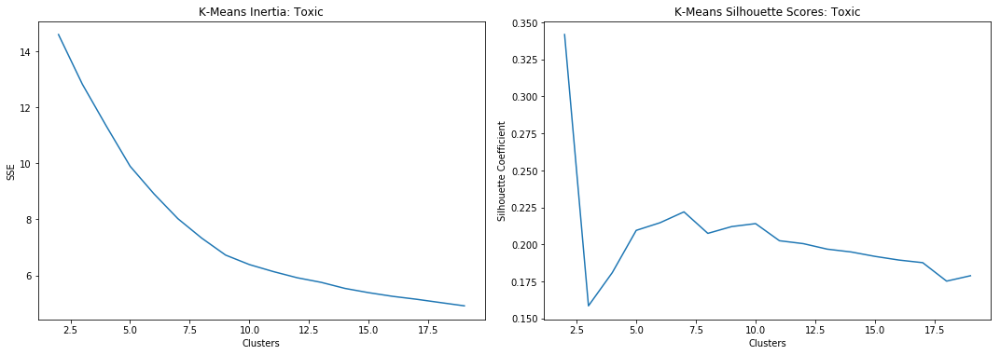

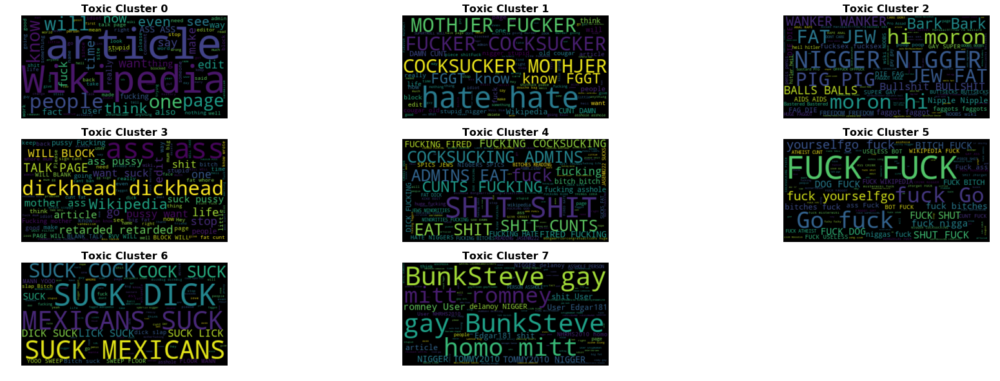

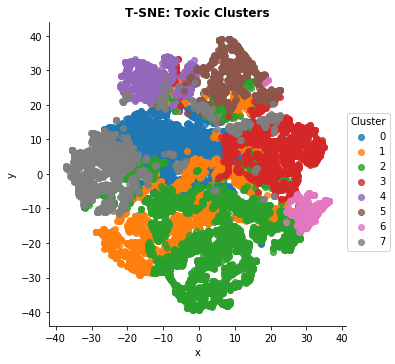

In [71]:
data = df_t.comment_text
n_clusters = 8
tag = 'Toxic'
ncols = 3

X_reduced = reduce_dimension(data, n_clusters)
X_reduced, labels = plot_kmc(X_reduced,n_clusters,tag)
wordcloud_visualizations(data,X_reduced,data,labels,n_clusters,ncols,tag)
_ = plot_tsne(X_reduced, labels, tag)

KMC saved at ../charts/kmc_Toxic.png
Inertia score: 5.749161262165864
Silhouette score: 0.2195863980043464
Cluster 0 has 3798 comments.
Cluster 1 has 1167 comments.
Cluster 2 has 1325 comments.
Cluster 3 has 6021 comments.
Cluster 4 has 1880 comments.
Cluster 5 has 2034 comments.
WordClouds saved at ../charts/wc_kmctsne_Toxic.png
T-SNE saved at ../charts/tsne_Toxic.png


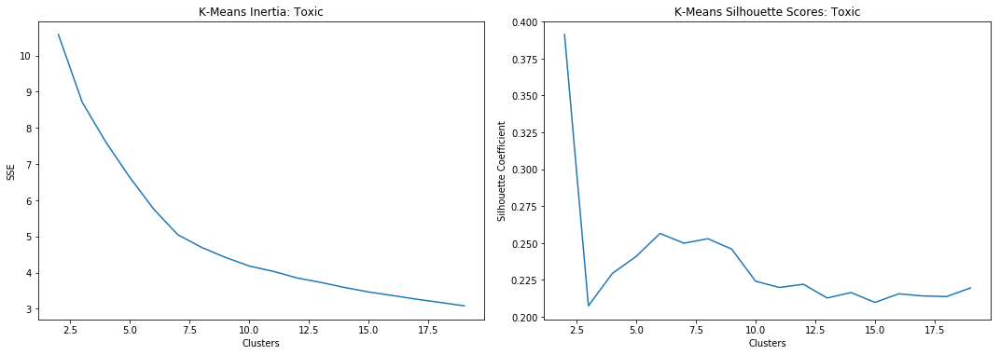

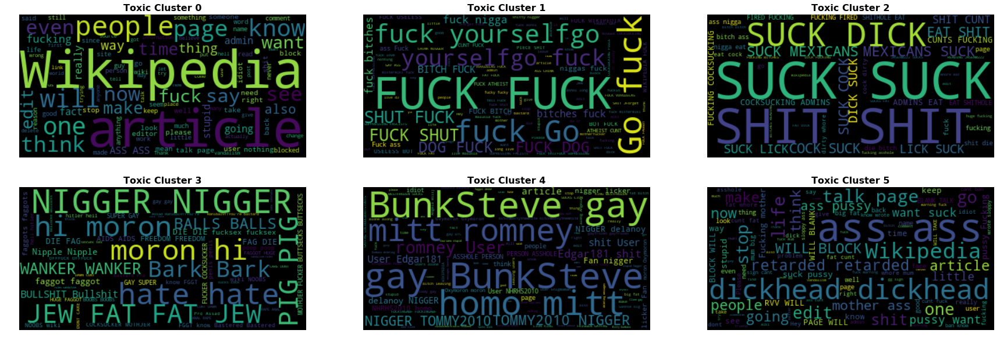

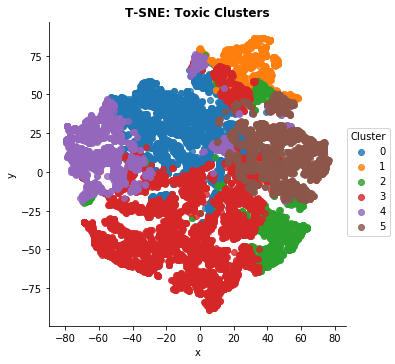

In [64]:
data = df_t.comment_text
n_clusters = 6
tag = 'Toxic'
ncols = 3

X_reduced = reduce_dimension(data, n_clusters)
X_reduced, labels = plot_kmc(X_reduced,n_clusters,tag)
wordcloud_visualizations(data,X_reduced,data,labels,n_clusters,ncols,tag)
_ = plot_tsne(X_reduced, labels, tag)

KMC saved at ../charts/kmc_Toxic.png
Inertia score: 4.640128760406259
Silhouette score: 0.23096697670728072
Cluster 0 has 4261 comments.
Cluster 1 has 386 comments.
Cluster 2 has 1028 comments.
Cluster 3 has 7516 comments.
Cluster 4 has 942 comments.
Cluster 5 has 2092 comments.
WordClouds saved at ../charts/wc_kmctsne_Toxic.png
T-SNE saved at ../charts/tsne_Toxic.png


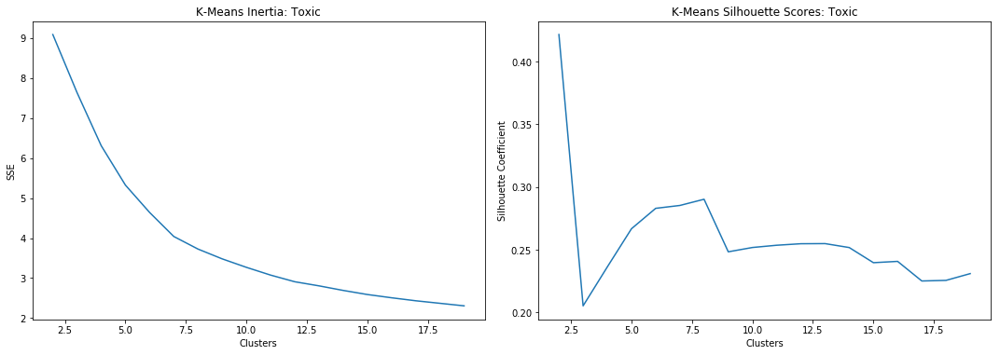

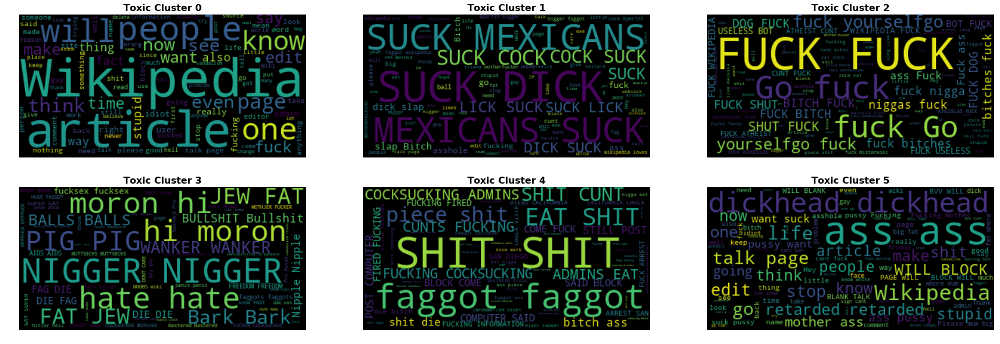

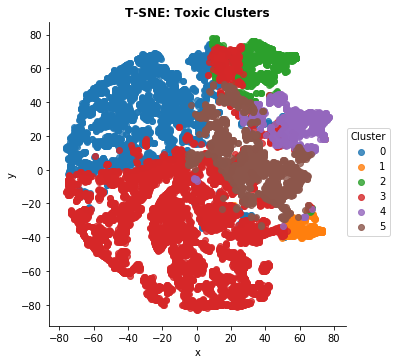

In [60]:
data = df_t.comment_text
n_clusters = 6
tag = 'Toxic'
ncols = 3

X_reduced = reduce_dimension(data, n_clusters)
X_reduced, labels = plot_kmc(X_reduced,n_clusters,tag)
wordcloud_visualizations(data,X_reduced,data,labels,n_clusters,ncols,tag)
_ = plot_tsne(X_reduced, labels, tag)

KMC saved at ../charts/kmc_Toxic.png
Inertia score: 4.251666777637652
Silhouette score: 0.23375085862008005
Cluster 0 has 3516 comments.
Cluster 1 has 6666 comments.
Cluster 2 has 917 comments.
Cluster 3 has 1060 comments.
Cluster 4 has 376 comments.
Cluster 5 has 3690 comments.
WordClouds saved at ../charts/wc_kmctsne_Toxic.png
T-SNE saved at ../charts/tsne_Toxic.png


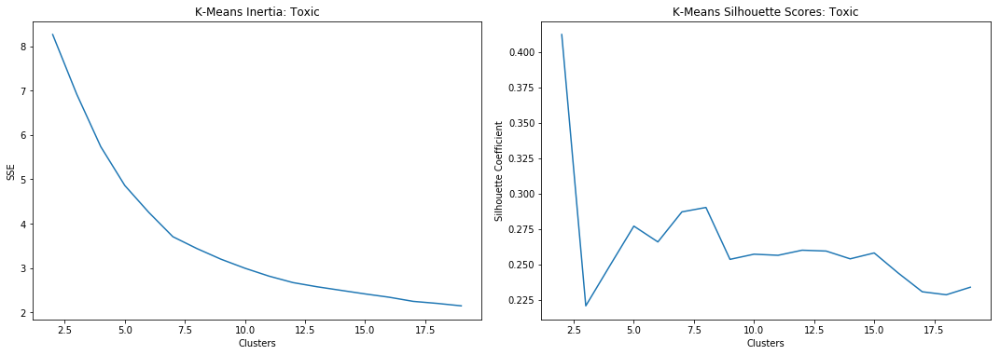

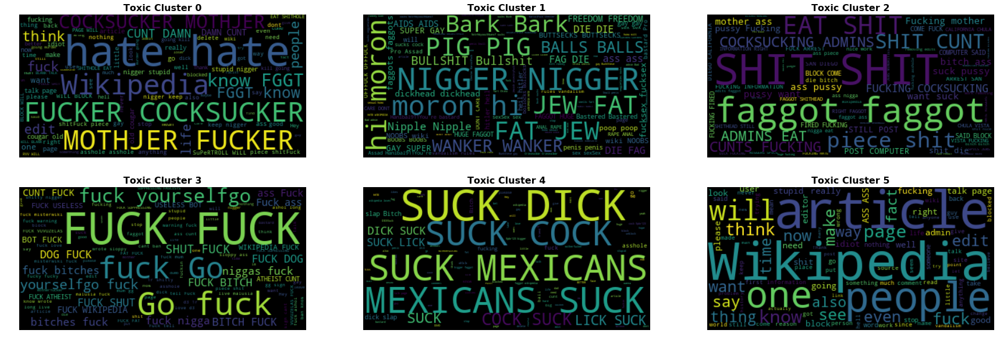

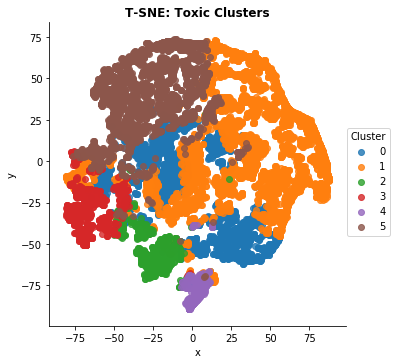

In [52]:
data = df_t.comment_text
n_clusters = 6
tag = 'Toxic'
ncols = 3

X_reduced = reduce_dimension(data, n_clusters)
X_reduced, labels = plot_kmc(X_reduced,n_clusters,tag)
wordcloud_visualizations(data,X_reduced,data,labels,n_clusters,ncols,tag)
_ = plot_tsne(X_reduced, labels, tag)

KMC saved at ../charts/kmc_All_Words.png
Inertia score: 10.772326350383153
Silhouette score: 0.18112588355079634
Cluster 0 has 11616 comments.
Cluster 1 has 38935 comments.
Cluster 2 has 1424 comments.
Cluster 3 has 8458 comments.
Cluster 4 has 1780 comments.
Cluster 5 has 69297 comments.
Cluster 6 has 24836 comments.
Cluster 7 has 1113 comments.
Cluster 8 has 1233 comments.
Cluster 9 has 879 comments.
WordClouds saved at ../charts/wc_kmctsne_All_Words.png


KeyboardInterrupt: 

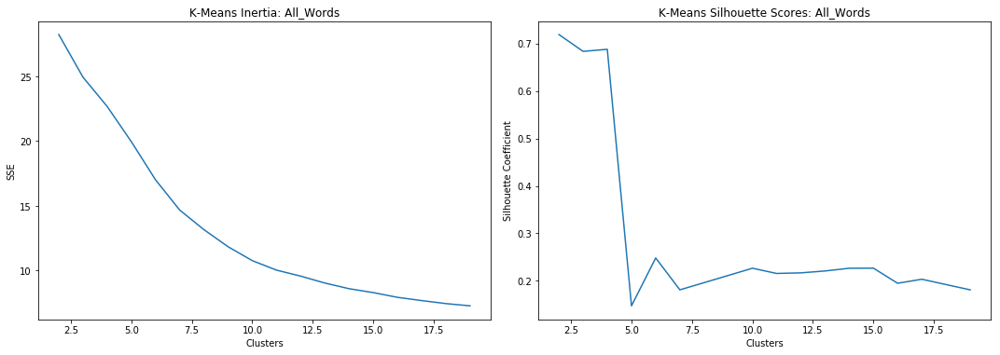

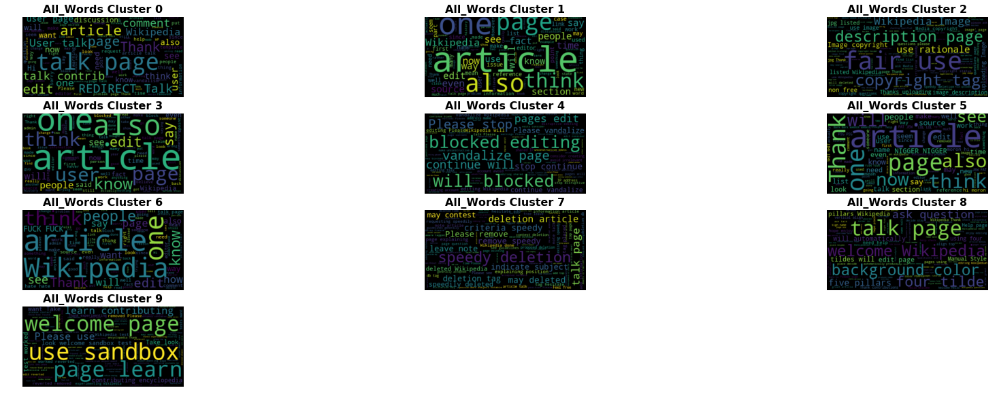

In [53]:
data = df.comment_text
n_clusters = 10
tag = 'All_Words'
ncols = 3

X_reduced = reduce_dimension(data, n_clusters)
X_reduced, labels = plot_kmc(X_reduced,n_clusters,tag)
wordcloud_visualizations(data,X_reduced,data,labels,n_clusters,ncols,tag)
_ = plot_tsne(X_reduced, labels, tag)

KMC saved at ../charts/kmc_Toxic.png
Inertia score: 4.251666777637652
Silhouette score: 0.261507393665863
Cluster 0 has 3516 comments.
Cluster 1 has 6666 comments.
Cluster 2 has 917 comments.
Cluster 3 has 1060 comments.
Cluster 4 has 376 comments.
Cluster 5 has 3690 comments.
WordClouds saved at ../charts/wc_kmctsne_Toxic.png
T-SNE saved at ../charts/tsne_Toxic.png


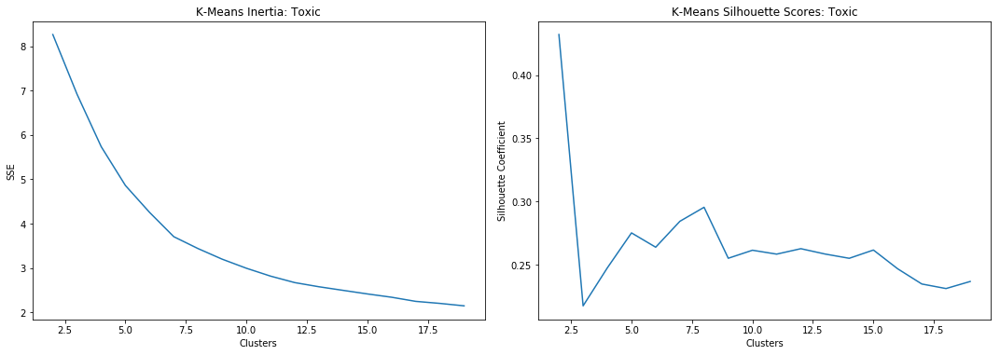

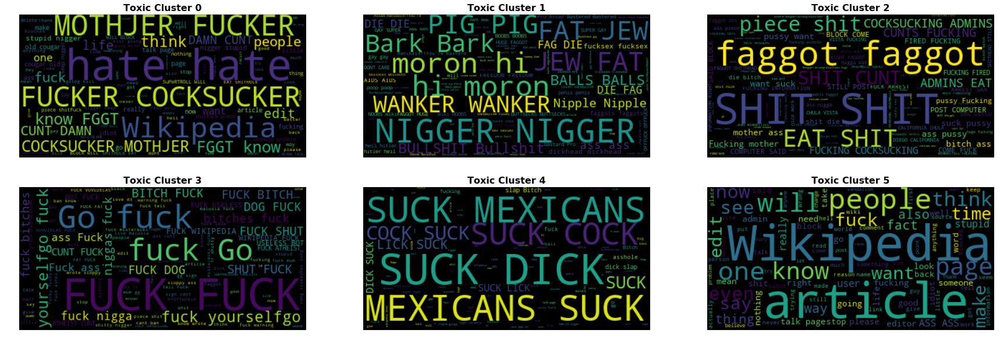

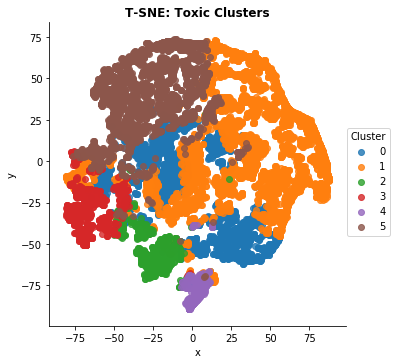

In [48]:
data = df_t.comment_text
n_clusters = 6
tag = 'Toxic'
ncols = 3

X_reduced = reduce_dimension(data, n_clusters)
X_reduced, labels = plot_kmc(X_reduced,n_clusters,tag)
wordcloud_visualizations(data,X_reduced,data,labels,n_clusters,ncols,tag)
_ = plot_tsne(X_reduced, labels, tag)

KMC saved at ../charts/kmc_Toxic.png
Inertia score: 4.512512693738526
Silhouette score: 0.2323466085730568
Cluster 0 has 2084 comments.
Cluster 1 has 4160 comments.
Cluster 2 has 1022 comments.
Cluster 3 has 7607 comments.
Cluster 4 has 963 comments.
Cluster 5 has 389 comments.
WordClouds saved at ../charts/wc_kmctsne_Toxic.png
T-SNE saved at ../charts/tsne_Toxic.png


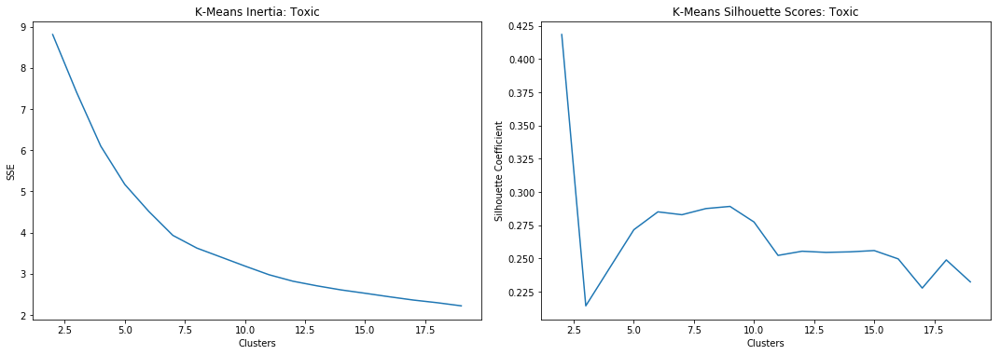

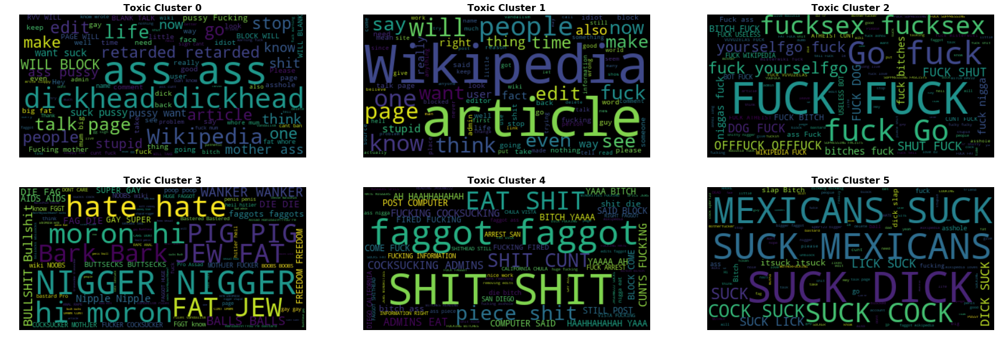

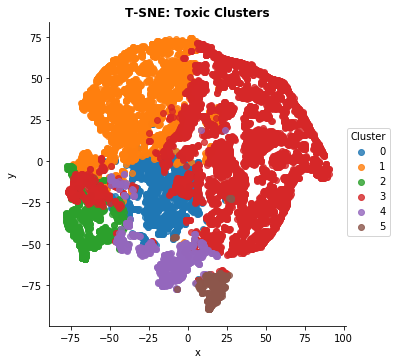

In [50]:
data = df_t.comment_text
n_clusters = 6
tag = 'Toxic'
ncols = 3

X_reduced = reduce_dimension(data, n_clusters)
X_reduced, labels = plot_kmc(X_reduced,n_clusters,tag)
wordcloud_visualizations(data,X_reduced,data,labels,n_clusters,ncols,tag)
_ = plot_tsne(X_reduced, labels, tag)

KMC saved at ../charts/kmc_Toxic.png
Inertia score: 2.550772391056346
Silhouette score: 0.3292228914584167
Cluster 0 has 4318 comments.
Cluster 1 has 11151 comments.
Cluster 2 has 90 comments.
Cluster 3 has 129 comments.
Cluster 4 has 16 comments.
Cluster 5 has 521 comments.
WordClouds saved at ../charts/wc_kmctsne_Toxic.png
T-SNE saved at ../charts/tsne_Toxic.png


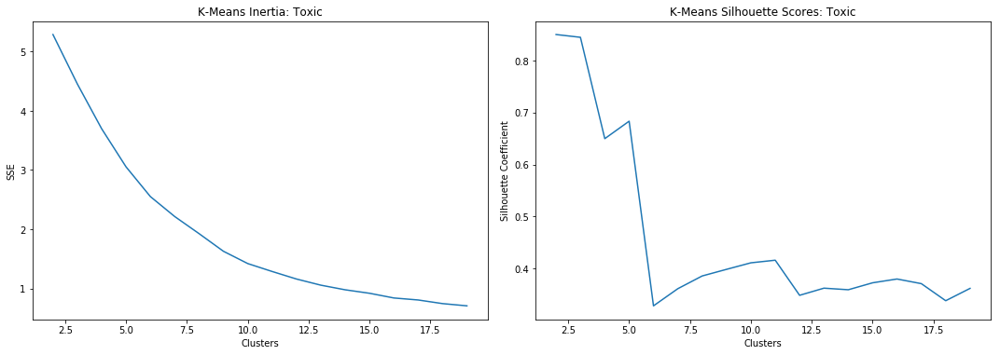

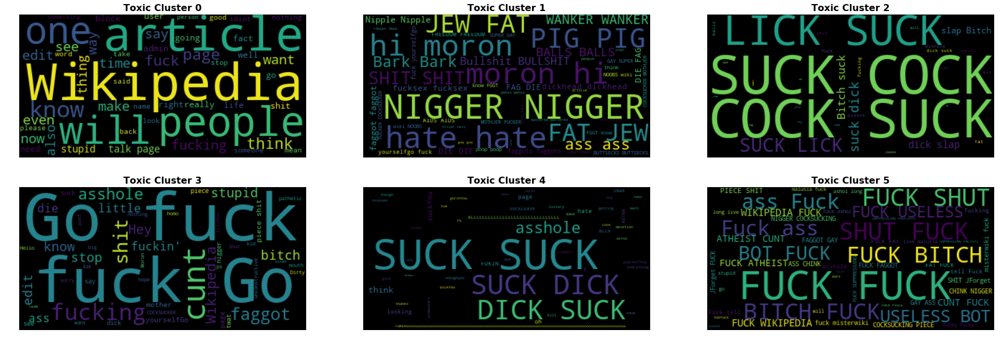

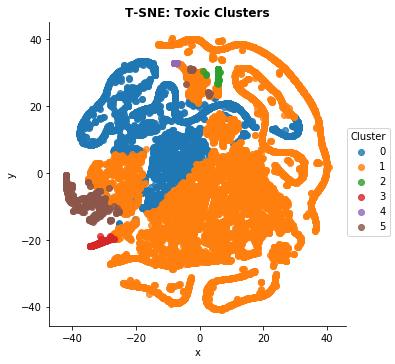

In [30]:
data = df_t.comment_text
n_clusters = 6
tag = 'Toxic'
ncols = 3
ngram_range = (1,3)

X_reduced = reduce_dimension(data, n_clusters,ngram_range)
X_reduced, labels = plot_kmc(X_reduced,n_clusters,tag)
wordcloud_visualizations(data,X_reduced,data,labels,n_clusters,ncols,tag)
_ = plot_tsne(X_reduced, labels, tag)

KMC saved at ../charts/kmc_Toxic.png
Inertia score: 3.3766572456508306
Silhouette score: 0.7133525636402802
Cluster 0 has 397 comments.
Cluster 1 has 14829 comments.
Cluster 2 has 170 comments.
Cluster 3 has 325 comments.
Cluster 4 has 244 comments.
Cluster 5 has 260 comments.
WordClouds saved at ../charts/wc_kmctsne_Toxic.png
T-SNE saved at ../charts/tsne_Toxic.png


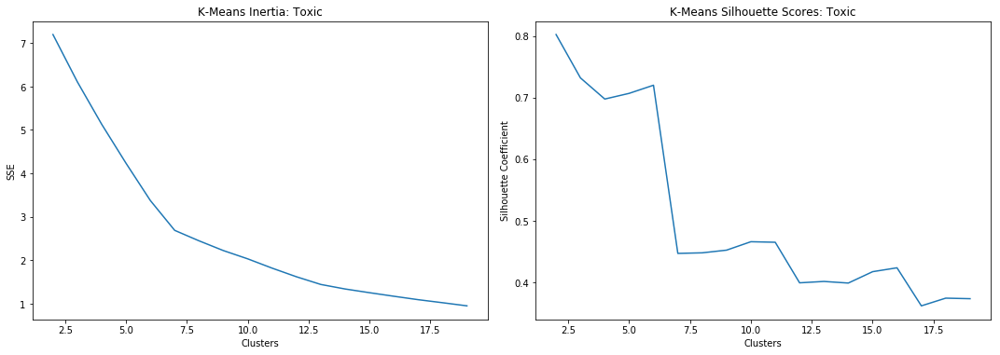

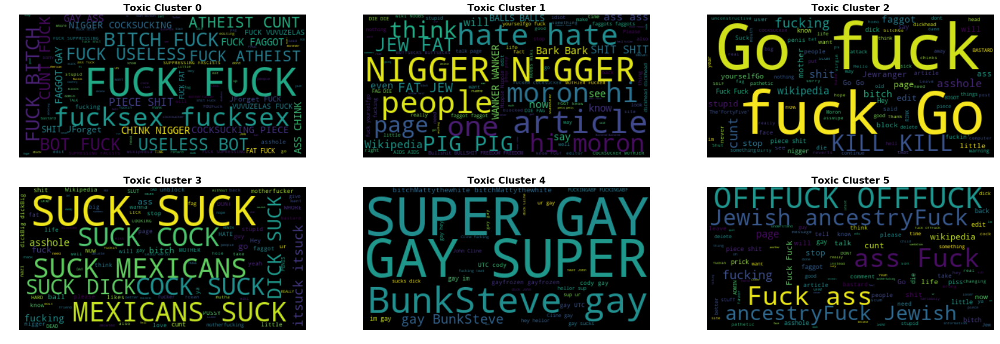

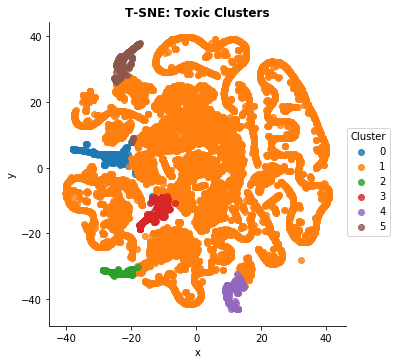

In [25]:
data = df_t.comment_text
n_clusters = 6
tag = 'Toxic'
ncols = 3
ngram_range = (1,10)

X_reduced = reduce_dimension(data, n_clusters,ngram_range)
X_reduced, labels = plot_kmc(X_reduced,n_clusters,tag)
wordcloud_visualizations(data,X_reduced,data,labels,n_clusters,ncols,tag)
_ = plot_tsne(X_reduced, labels, tag)

KMC saved at ../charts/kmc_Toxic.png
Inertia score: 3.251836873560276
Silhouette score: 0.34654917135577323
Cluster 0 has 4276 comments.
Cluster 1 has 424 comments.
Cluster 2 has 160 comments.
Cluster 3 has 10751 comments.
Cluster 4 has 347 comments.
Cluster 5 has 267 comments.
WordClouds saved at ../charts/wc_kmctsne_Toxic.png
T-SNE saved at ../charts/tsne_Toxic.png


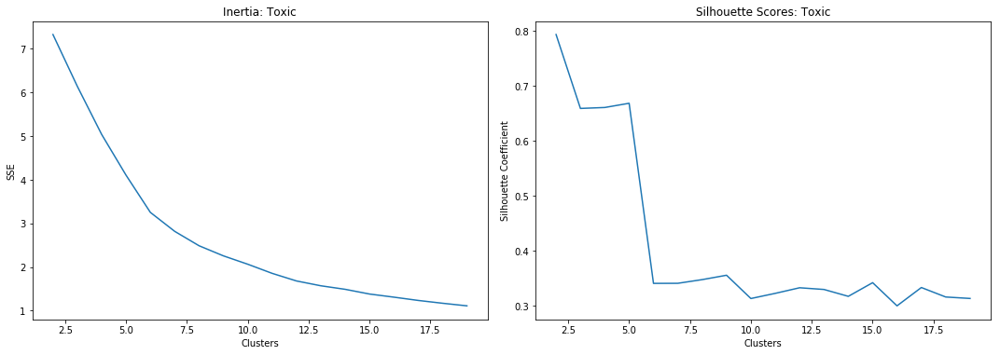

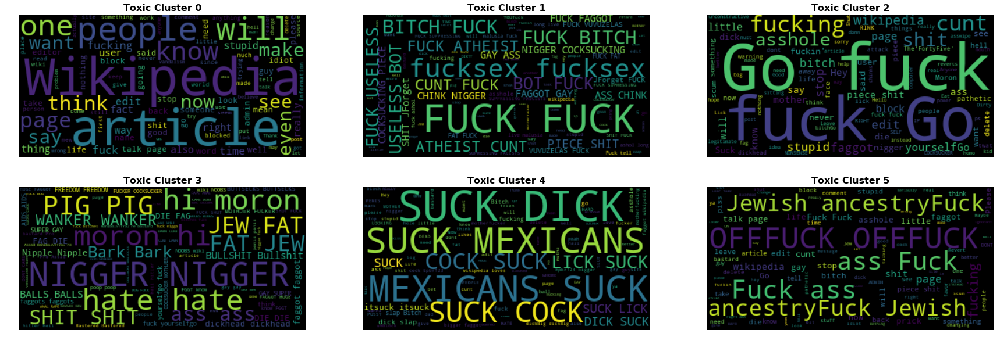

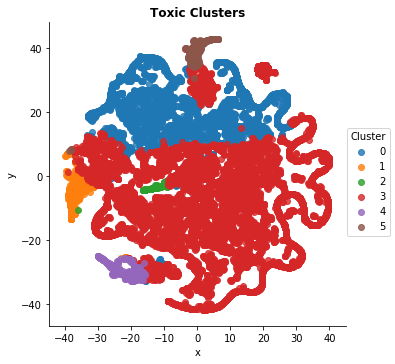

In [14]:
data = df_t.comment_text
n_clusters = 6
tag = 'Toxic'
ncols = 3
ngram_range = (1,3)

X_reduced = reduce_dimension(data, n_clusters,ngram_range)
X_reduced, labels = plot_kmc(X_reduced,n_clusters,tag)
wordcloud_visualizations(data,X_reduced,data,labels,n_clusters,ncols,tag)
_ = plot_tsne(X_reduced, labels, tag)

KMC saved at ../charts/kmc_All_Words.png
Inertia score: 10.332843413895104
Silhouette score: 0.28143232433577925
Cluster 0 has 55334 comments.
Cluster 1 has 798 comments.
Cluster 2 has 635 comments.
Cluster 3 has 921 comments.
Cluster 4 has 1400 comments.
Cluster 5 has 1334 comments.
Cluster 6 has 995 comments.
Cluster 7 has 98154 comments.
WordClouds saved at ../charts/wc_kmctsne_All_Words.png
T-SNE saved at ../charts/tsne_All_Words.png


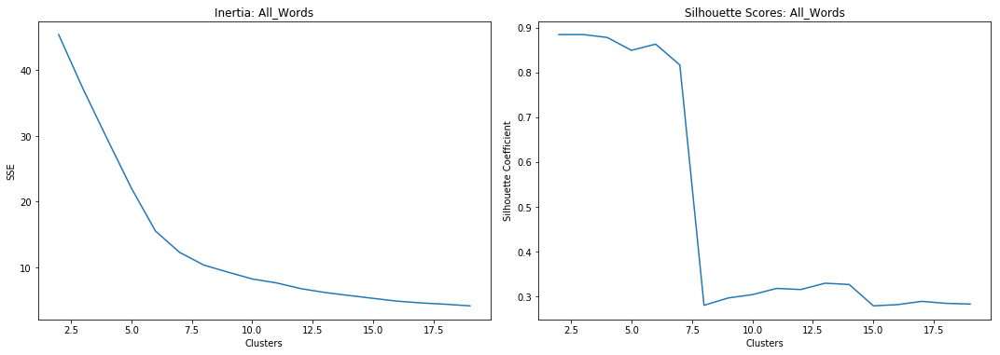

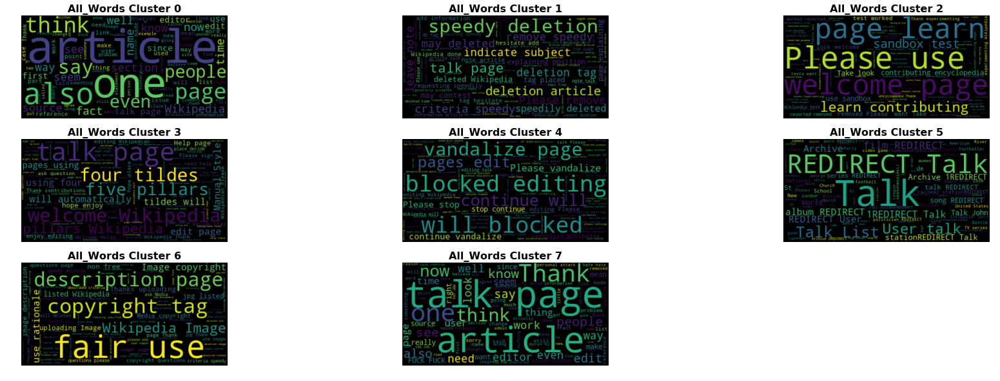

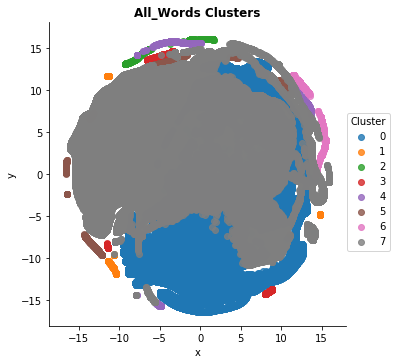

In [15]:
data = df.comment_text
n_clusters = 8
tag = 'All_Words'
ncols = 3
ngram_range = (1,3)

X_reduced = reduce_dimension(data, n_clusters,ngram_range)
X_reduced, labels = plot_kmc(X_reduced,n_clusters,tag)
wordcloud_visualizations(data,X_reduced,data,labels,n_clusters,ncols,tag)
_ = plot_tsne(X_reduced, labels, tag)

KMC saved at ../charts/kmc_Toxic.png
Inertia score: 4.514919039372154
Silhouette score: 0.2836693466512479
Cluster 0 has 1015 comments.
Cluster 1 has 964 comments.
Cluster 2 has 4155 comments.
Cluster 3 has 2081 comments.
Cluster 4 has 389 comments.
Cluster 5 has 7621 comments.
WordClouds saved at ../charts/wc_kmctsne_Toxic.png
T-SNE saved at ../charts/tsne_Toxic.png


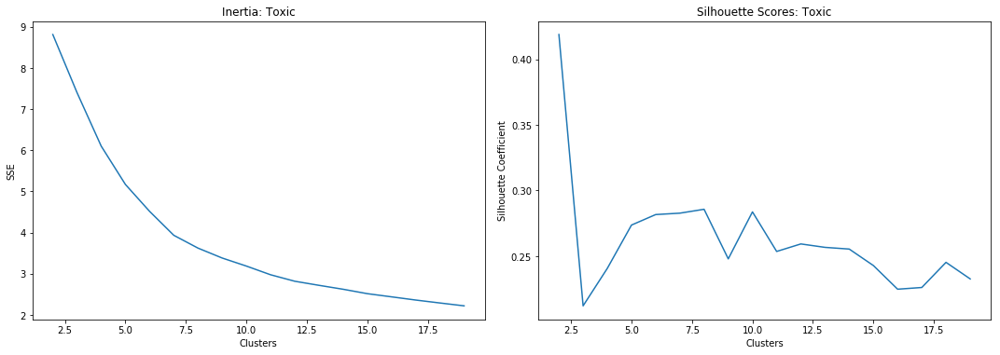

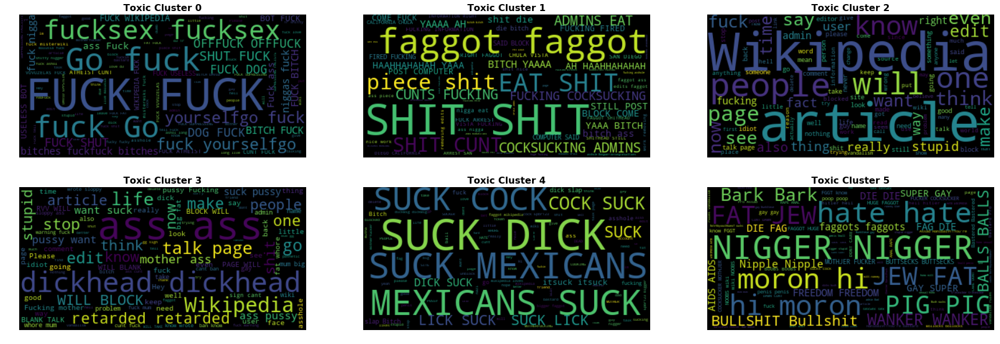

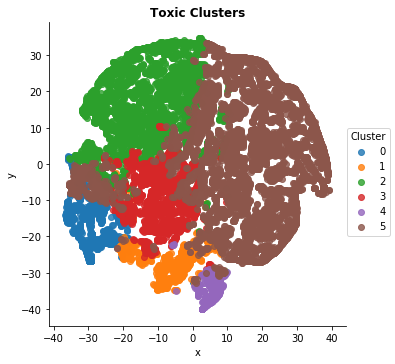

In [10]:
data = df_t.comment_text
n_clusters = 6
tag = 'Toxic'
ncols = 3

X_reduced = reduce_dimension(data, n_clusters)
X_reduced, labels = plot_kmc(X_reduced,n_clusters,tag)
wordcloud_visualizations(data,X_reduced,data,labels,n_clusters,ncols,tag)
_ = plot_tsne(X_reduced, labels, tag)

KMC saved at ../charts/kmc_Toxic.png
Inertia score: 4.3991643026860245
Silhouette score: 0.2822502745724405
Cluster 0 has 7384 comments.
Cluster 1 has 1020 comments.
Cluster 2 has 4424 comments.
Cluster 3 has 2051 comments.
Cluster 4 has 387 comments.
Cluster 5 has 959 comments.
WordClouds saved at ../charts/wc_kmctsne_Toxic.png
T-SNE saved at ../charts/tsne_Toxic.png


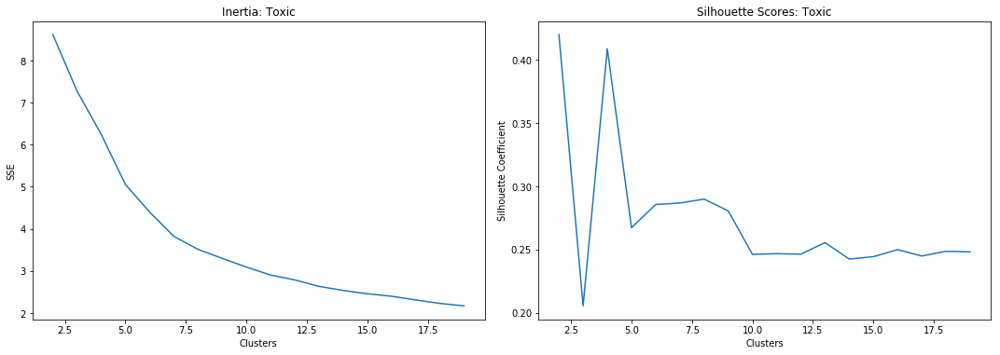

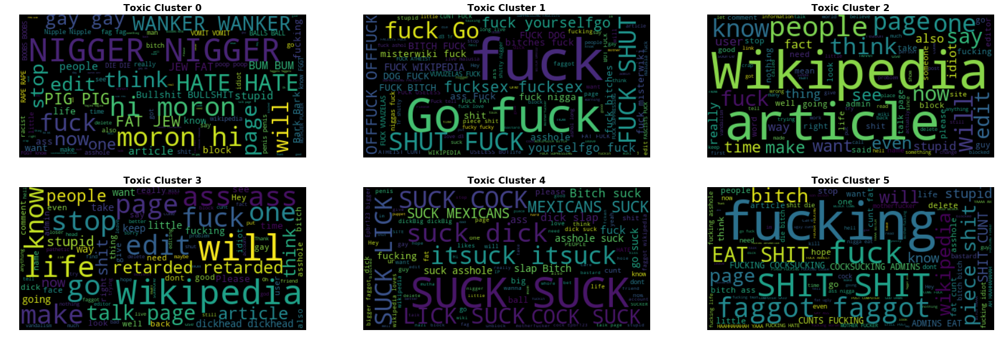

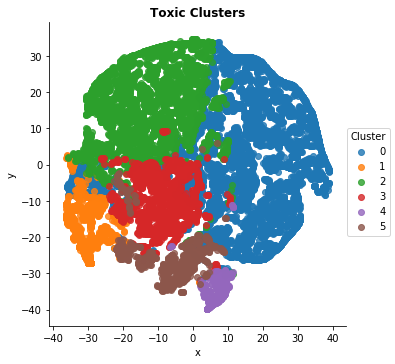

In [8]:
data = df_t.comment_text_s
n_clusters = 6
tag = 'Toxic'
ncols = 3

X_reduced = reduce_dimension(data, n_clusters)
X_reduced, labels = plot_kmc(X_reduced,n_clusters,tag)
wordcloud_visualizations(data,X_reduced,data,labels,n_clusters,ncols,tag)
_ = plot_tsne(X_reduced, labels, tag)

In [ ]:
data = df_nt.comment_text_clean
n_clusters = 6
tag = 'Clean'
ncols = 3

X_reduced = reduce_dimension(data, n_clusters)
X_reduced, labels = plot_kmc(X_reduced,n_clusters,tag)
wordcloud_visualizations(data,X_reduced,data,labels,n_clusters,ncols,tag)
_ = plot_tsne(X_reduced, labels, tag)

In [ ]:
data = df.comment_text_clean
n_clusters = 4
tag = 'All_Words'
ncols = 3

X_reduced = reduce_dimension(data, n_clusters)
X_reduced, labels = plot_kmc(X_reduced,n_clusters,tag)
wordcloud_visualizations(data,X_reduced,data,labels,n_clusters,ncols,tag)
_ = plot_tsne(X_reduced, labels, tag)

KMC saved at ../charts/kmc_Toxic.png
Inertia score: 5.407760245290074
Silhouette score: 0.23524192019081283
Cluster 0 has 959 comments.
Cluster 1 has 1677 comments.
Cluster 2 has 374 comments.
Cluster 3 has 3013 comments.
Cluster 4 has 5370 comments.
Cluster 5 has 306 comments.
Cluster 6 has 849 comments.
Cluster 7 has 3677 comments.
T-SNE saved at ../charts/tsne_Toxic.png


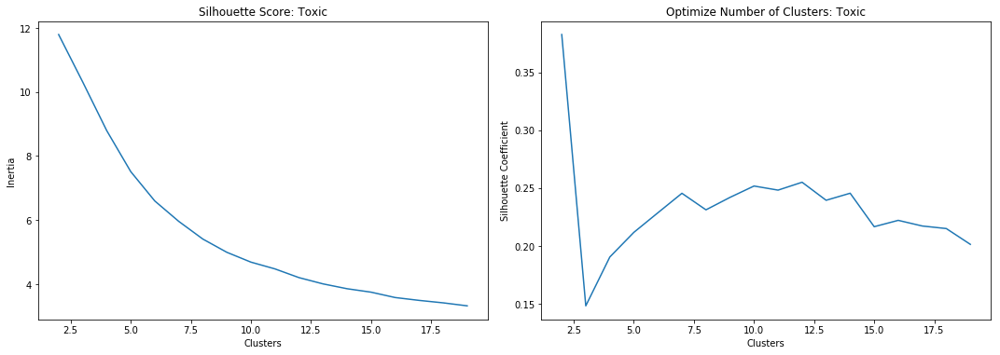

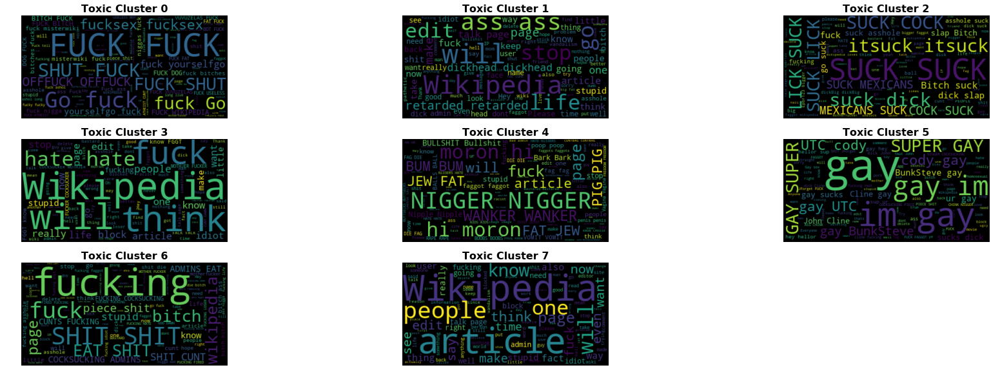

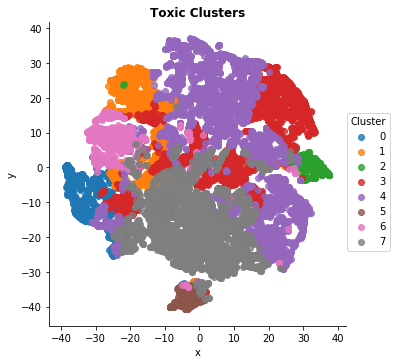

In [6]:
# helper functions broken out to troubleshoot
data = df_t.comment_text_s
n_clusters = 6
tag = 'Toxic'
ncols = 3

X_reduced = reduce_dimension(data, n_clusters)
X_reduced, labels = plot_kmc(X_reduced,n_clusters,tag)
wordcloud_visualizations(X_reduced,data,labels,n_clusters,ncols,tag)
_ = plot_tsne(X_reduced, labels, tag)

KMC saved at ../charts/kmc_Toxic.png
Inertia score: 4.836771698186017
Silhouette score: 0.2382904026581991
Cluster 0 has 5470 comments.
Cluster 1 has 1706 comments.
Cluster 2 has 868 comments.
Cluster 3 has 976 comments.
Cluster 4 has 3728 comments.
Cluster 5 has 3098 comments.
Cluster 6 has 379 comments.
T-SNE saved at ../charts/tsne_Toxic.png


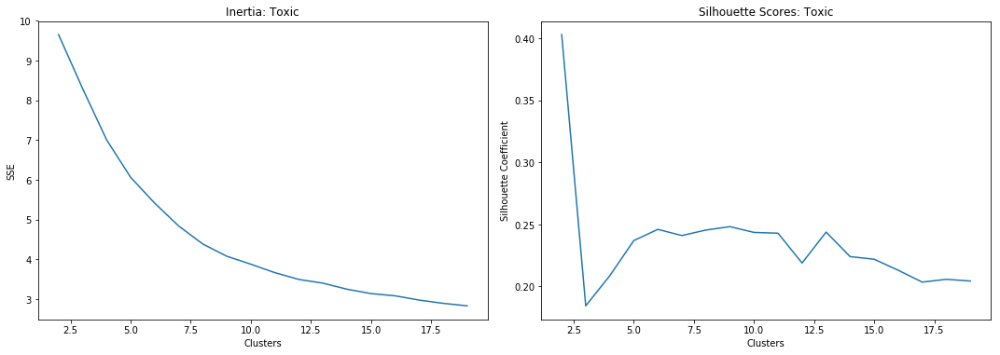

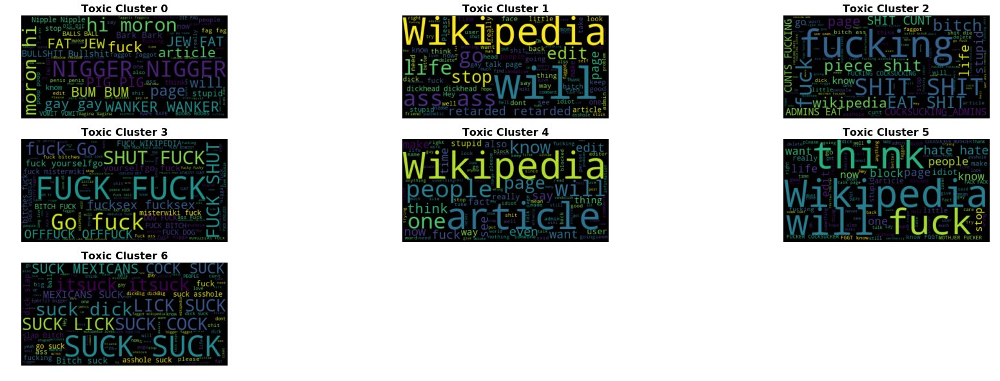

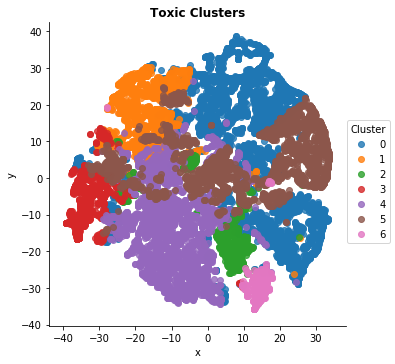

In [37]:
data = df_t.comment_text_s
n_clusters = 7
tag = 'Toxic'
ncols = 3

X_reduced = reduce_dimension(data, n_clusters)
X_reduced, labels = plot_kmc(X_reduced,n_clusters,tag)
wordcloud_visualizations(data,X_reduced,data,labels,n_clusters,ncols,tag)
_ = plot_tsne(X_reduced, labels, tag)

In [ ]:
df_t['cluster'] = labels
df_t.to_pickle('../data/df_t_cluster.pkl')

In [10]:
df_t.head()

,id,comment_text,toxic,severe_toxic,obscene,threat,insult,identity_hate,category,rating,...,polarity_sentence,polarity_comment,polarity_comment_s,word_count,char_count,char_count_s,polarity_min,polarity_max,polarity_mean,cluster
idx,,,,,,,,,,,,,,,,,,,,,
3a4c7758fad18de3,3a4c7758fad18de3,", I hope your retarded kids get anal raped and...",1,1,1,1,1,1,ToSTObThInIH,6,...,"(-0.6, 1.0, -0.018750000000000003, [-0.4, -0.4...",0.00,0.00,94,494,494,-0.6000,1.0000,-0.018750,0
24d2b50726b67167,24d2b50726b67167,I am going to murder ZimZalaBim ST47 for being...,1,1,1,1,1,1,ToSTObThInIH,6,...,"(-1.0, -1.0, -1.0, [-1.0])",0.00,0.00,12,68,68,-1.0000,-1.0000,-1.000000,4
c586b7a2fd575b13,c586b7a2fd575b13,"Shut up you asswipe, we don't care. I'll decap...",1,1,1,1,1,1,ToSTObThInIH,6,...,"(-0.2, 0.0, -0.07555555555555557, [0.0, -0.177...",-0.25,-0.25,24,3890,1000,-0.2000,0.0000,-0.075556,4
77d84b1321c22d9a,77d84b1321c22d9a,"LGBT \n\nyou little fuck , are you a fag , tha...",1,1,1,1,1,1,ToSTObThInIH,6,...,"(-0.17750000000000005, 0.0, -0.088750000000000...",0.00,0.00,56,280,280,-0.1775,0.0000,-0.088750,7
1368c10281978876,1368c10281978876,"You're a stupid cunt \n\nFuck you dumb arse, y...",1,1,1,1,1,1,ToSTObThInIH,6,...,"(-0.41250000000000003, -0.41250000000000003, -...",0.00,0.00,59,278,278,-0.4125,-0.4125,-0.412500,3


KMC saved at ../charts/kmc_Clean.png
Inertia score: 5.155512324659611
Silhouette score: 0.38103921793411827
Cluster 0 has 34566 comments.
Cluster 1 has 107038 comments.
Cluster 2 has 1742 comments.


KeyboardInterrupt: 

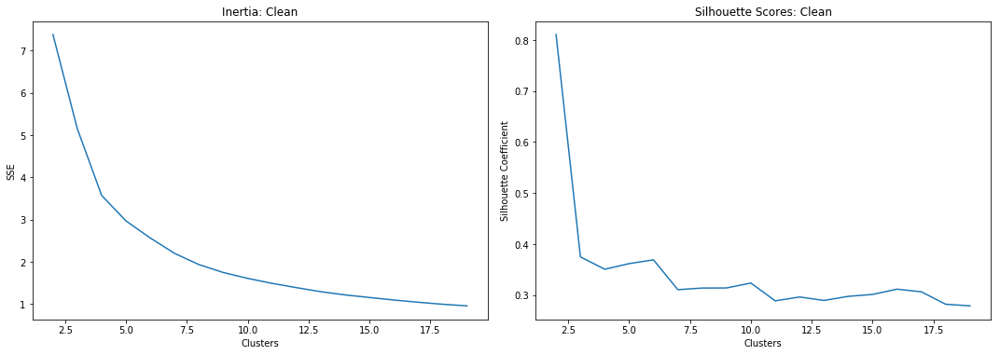

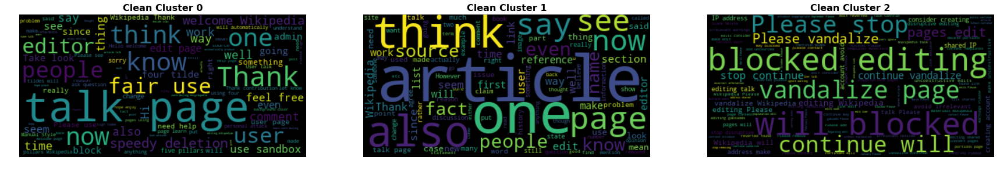

In [38]:
data = df_nt.comment_text_s
n_clusters = 3
tag = 'Clean'
ncols = 3

X_reduced = reduce_dimension(data, n_clusters)
X_reduced, labels = plot_kmc(X_reduced,n_clusters,tag)
wordcloud_visualizations(data,X_reduced,data,labels,n_clusters,ncols,tag)
_ = plot_tsne(X_reduced, labels, tag)

In [ ]:
data = df.comment_text_s
n_clusters = 8
tag = 'All_Words'
ncols = 3

X_reduced = reduce_dimension(data, n_clusters)
X_reduced, labels = plot_kmc(X_reduced,n_clusters,tag)
wordcloud_visualizations(data,X_reduced,data,labels,n_clusters,ncols,tag)
_ = plot_tsne(X_reduced, labels, tag)

In [ ]:
# data, n_clusters, seed, ncols,tag
# data = df.comment_text_s
# n_clusters = 10
# tag = 'All'
# create_kmc_tsne(data,n_clusters,seed,3,tag)

KMC saved at ../charts/kmc_Clean.png
Inertia score: 7.40315204894377
Silhouette score: 0.8113496421007259
Cluster 0 has 136006 comments.
Cluster 1 has 2245 comments.
Cluster 2 has 1224 comments.
Cluster 3 has 1823 comments.
Cluster 4 has 876 comments.
Cluster 5 has 1172 comments.
WordClouds saved at ../charts/wc_kmctsne_Clean.png
T-SNE saved at ../charts/tsne_Clean.png


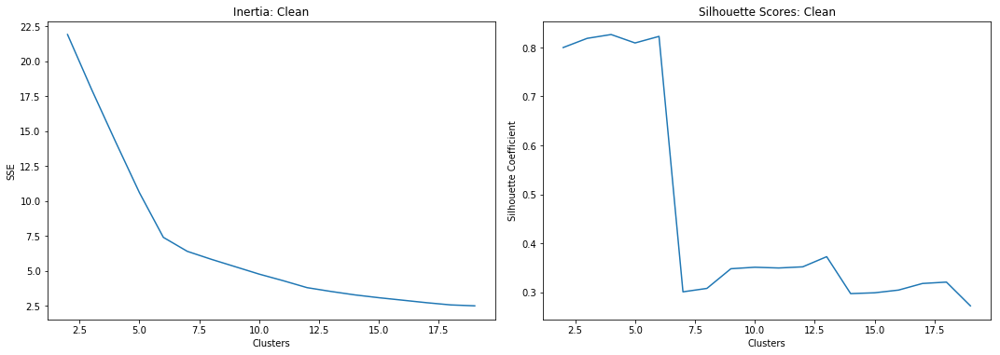

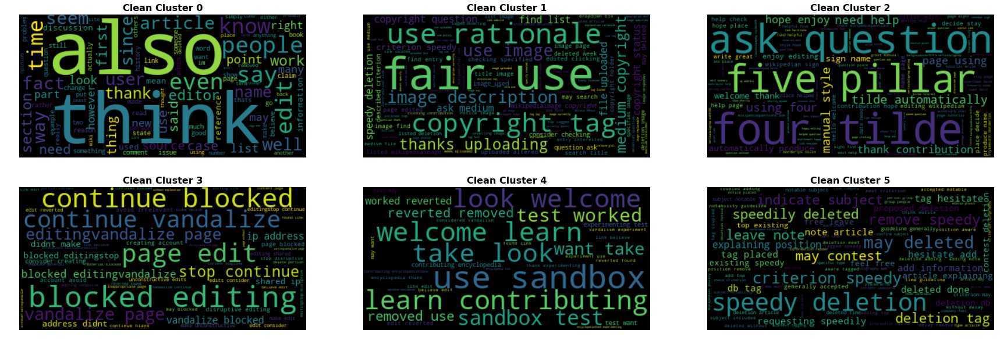

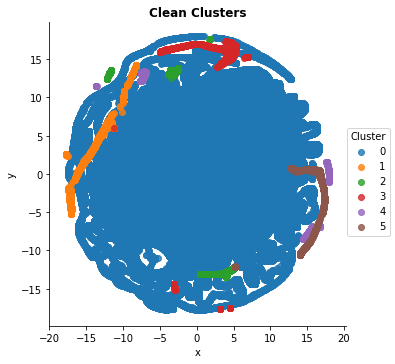

KMC saved at ../charts/kmc_Clean.png
Inertia score: 8.252386977514462
Silhouette score: 0.266631411709352
Cluster 0 has 2256 comments.
Cluster 1 has 75696 comments.
Cluster 2 has 2462 comments.
Cluster 3 has 52084 comments.
Cluster 4 has 1750 comments.
Cluster 5 has 9098 comments.
WordClouds saved at ../charts/wc_kmctsne_Clean.png
T-SNE saved at ../charts/tsne_Clean.png


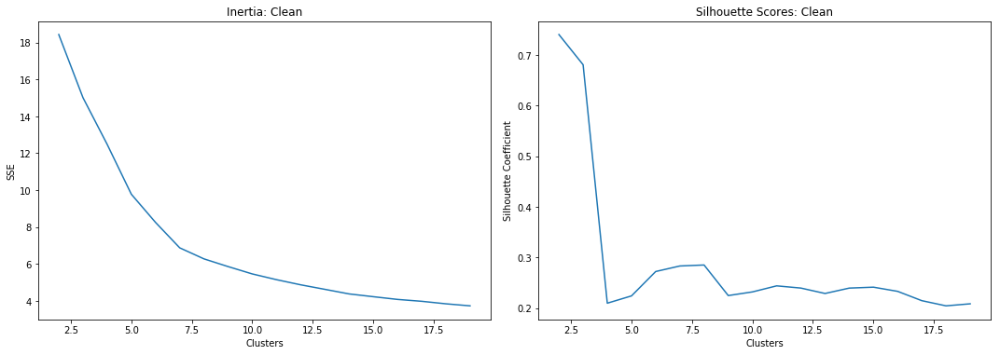

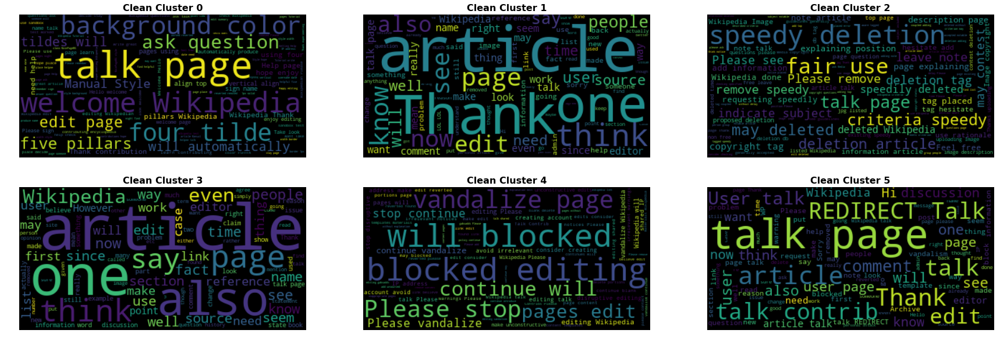

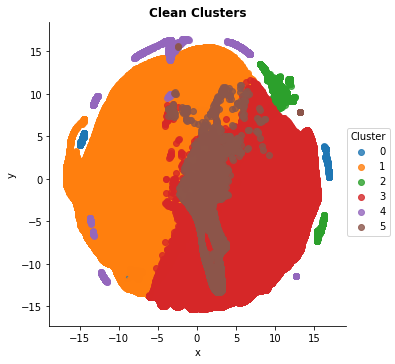

In [6]:
data = df_nt.comment_text
n_clusters = 6
tag = 'Clean'
ncols = 3

X_reduced = reduce_dimension(data, n_clusters)
X_reduced, labels = plot_kmc(X_reduced,n_clusters,tag)
wordcloud_visualizations(data,X_reduced,data,labels,n_clusters,ncols,tag)
_ = plot_tsne(X_reduced, labels, tag)

KMC saved at ../charts/kmc_All_Words.png
Inertia score: 7.553290168252416
Silhouette score: 0.8160248591252589
Cluster 0 has 152076 comments.
Cluster 1 has 1189 comments.
Cluster 2 has 1227 comments.
Cluster 3 has 1851 comments.
Cluster 4 has 2348 comments.
Cluster 5 has 880 comments.
WordClouds saved at ../charts/wc_kmctsne_All_Words.png
T-SNE saved at ../charts/tsne_All_Words.png


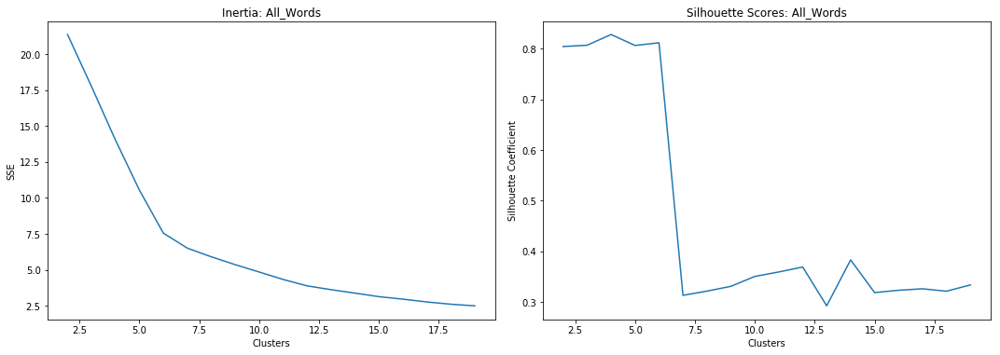

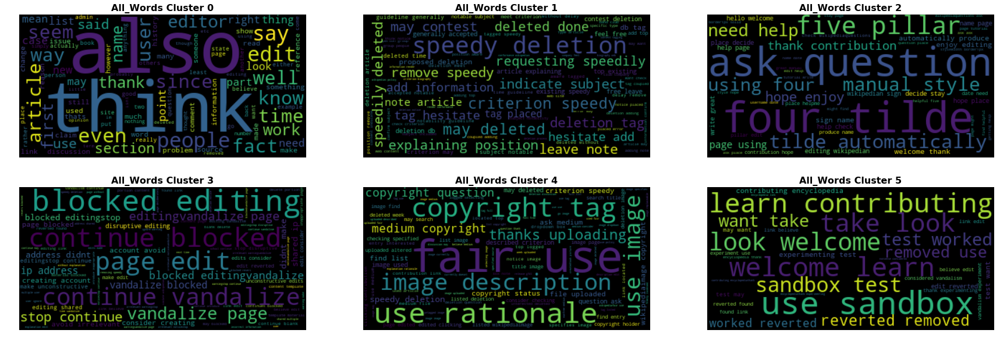

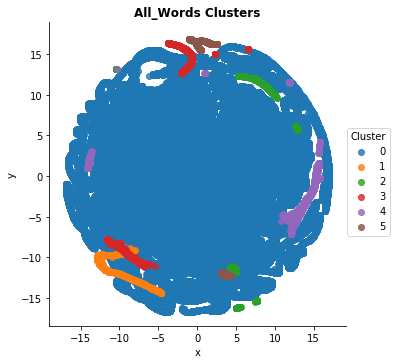

In [9]:
data = df.comment_text
n_clusters = 8
tag = 'All_Words'
ncols = 3

X_reduced = reduce_dimension(data, n_clusters)
X_reduced, labels = plot_kmc(X_reduced,n_clusters,tag)
wordcloud_visualizations(data,X_reduced,data,labels,n_clusters,ncols,tag)
_ = plot_tsne(X_reduced, labels, tag)

KeyboardInterrupt: 